In [1]:
# In this case calculate the nutration part along.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings('ignore')

In [3]:
data = pd.read_csv('starbucks-menu-nutrition-drinks.csv')
data.head(10)

,Unnamed: 0,Calories,Fat (g),Carb. (g),Fiber (g),Protein,Sodium
0,Cool Lime Starbucks Refreshers™ Beverage,45,0,11,0,0,10
1,Ombré Pink Drink,-,-,-,-,-,-
2,Pink Drink,-,-,-,-,-,-
3,Strawberry Acai Starbucks Refreshers™ Beverage,80,0,18,1,0,10
4,Very Berry Hibiscus Starbucks Refreshers™ Beve...,60,0,14,1,0,10
5,Violet Drink,-,-,-,-,-,-
6,Evolution Fresh™ Cold-Pressed Apple Berry Juice,-,-,-,-,-,-
7,Evolution Fresh™ Defense Up,-,-,-,-,-,-
8,Evolution Fresh™ Organic Ginger Limeade,110,0,28,0,0,5
9,Iced Coffee,0,0,0,0,0,0


In [4]:
data.shape

(177, 7)

In [5]:
# cheak duplicates
data.duplicated().sum()

22

In [6]:
# Drop duplicates
data.drop_duplicates(inplace = True)
data.duplicated().sum()

0

In [7]:
# cheak null value
data.isnull().sum()

Unnamed: 0    0
Calories      0
Fat (g)       0
Carb. (g)     0
Fiber (g)     0
Protein       0
Sodium        0
dtype: int64

In [8]:
data.nunique()  

Unnamed: 0    154
Calories       30
Fat (g)        15
Carb. (g)      34
Fiber (g)       8
Protein        17
Sodium         25
dtype: int64

In [9]:
data.columns

Index(['Unnamed: 0', 'Calories', 'Fat (g)', 'Carb. (g)', 'Fiber (g)',
       'Protein', 'Sodium'],
      dtype='object')

In [10]:
data['Calories'] = pd.to_numeric(data['Calories'], errors='coerce')

# data['Fat (g)'] = data['Fat (g)'].astype(float)
data['Fat (g)'] = pd.to_numeric(data['Fat (g)'], errors='coerce')
data['Carb. (g)'] = pd.to_numeric(data['Carb. (g)'], errors='coerce')

data['Fiber (g)'] = pd.to_numeric(data['Fiber (g)'], errors='coerce')
data['Protein'] = pd.to_numeric(data['Protein'], errors='coerce')
data['Sodium'] = pd.to_numeric(data['Sodium'], errors='coerce')

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 155 entries, 0 to 176
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  155 non-null    object 
 1   Calories    75 non-null     float64
 2   Fat (g)     75 non-null     float64
 3   Carb. (g)   75 non-null     float64
 4   Fiber (g)   75 non-null     float64
 5   Protein     75 non-null     float64
 6   Sodium      75 non-null     float64
dtypes: float64(6), object(1)
memory usage: 9.7+ KB


In [12]:
# Calories
data['Calories'].value_counts()

5.0      7
140.0    7
60.0     5
250.0    4
70.0     4
200.0    4
90.0     3
110.0    3
130.0    3
150.0    3
120.0    3
30.0     3
190.0    3
300.0    2
320.0    2
45.0     2
10.0     2
80.0     2
0.0      2
260.0    2
360.0    1
350.0    1
230.0    1
50.0     1
180.0    1
290.0    1
430.0    1
210.0    1
280.0    1
Name: Calories, dtype: int64

<Axes: xlabel='Calories', ylabel='count'>

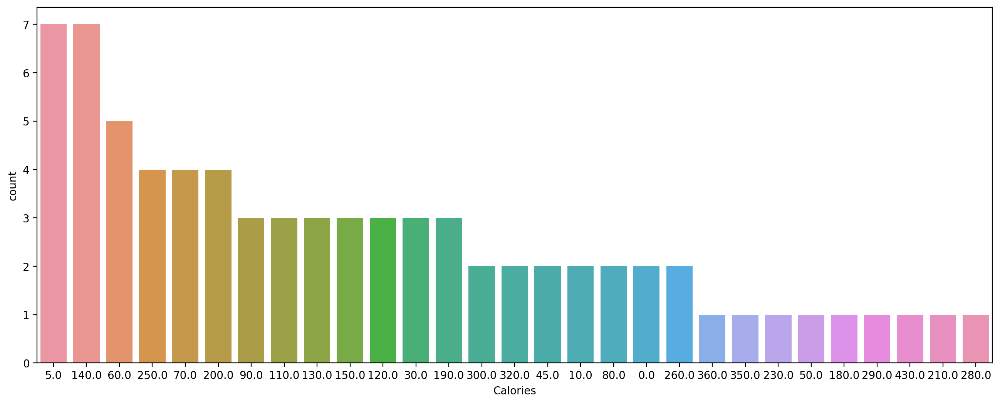

In [13]:
# Calories
calory_desc = data['Calories'].value_counts().index
plt.figure(figsize= (16,6), dpi = 200)
sns.countplot(x ='Calories', data = data,order = calory_desc)

In [14]:
# Unnamed: 0 affected by Calories
data.groupby(by="Unnamed: 0")['Calories'].mean().sort_values(ascending = False)

Unnamed: 0
Starbucks® Signature Hot Chocolate                   430.0
White Chocolate Mocha                                360.0
Cinnamon Dolce Frappuccino® Blended Coffee           350.0
Hot Chocolate                                        320.0
Chocolate Smoothie                                   320.0
                                                     ...  
Toasted Coconut Cold Brew                              NaN
Vanilla Bean Crème Frappuccino® Blended Crème          NaN
Violet Drink                                           NaN
White Chocolate Mocha Bottled Frappuccino              NaN
White Chocolate Mocha Frappuccino® Blended Coffee      NaN
Name: Calories, Length: 154, dtype: float64

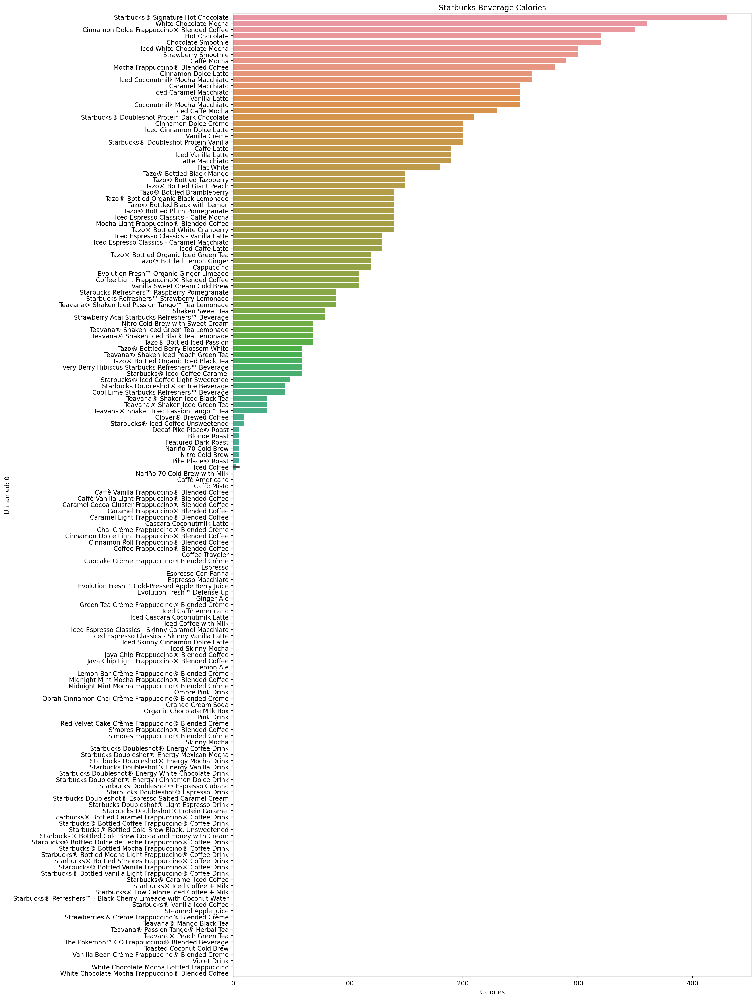

In [15]:
desc_order = data.groupby(by="Unnamed: 0")['Calories'].mean().sort_values(ascending = False).index
plt.figure(figsize=(15, 28), dpi= 200 )
sns.barplot(y="Unnamed: 0", x="Calories", data=data, order = desc_order)
# plt.xticks(rotation=40, ha='right')
plt.title("Starbucks Beverage Calories")
plt.show()

- **Overall, Starbucks® Signature Hot Chocolate , followed by White Chocolate Mocha out of the entire starbucks drinks**

### Sodium

In [16]:
data.Sodium.value_counts()

10.0     19
0.0      11
5.0       6
15.0      5
150.0     4
115.0     3
180.0     3
160.0     3
100.0     2
65.0      2
90.0      2
135.0     2
170.0     2
220.0     1
200.0     1
40.0      1
240.0     1
140.0     1
190.0     1
95.0      1
25.0      1
20.0      1
120.0     1
130.0     1
Name: Sodium, dtype: int64

<Axes: xlabel='Sodium', ylabel='count'>

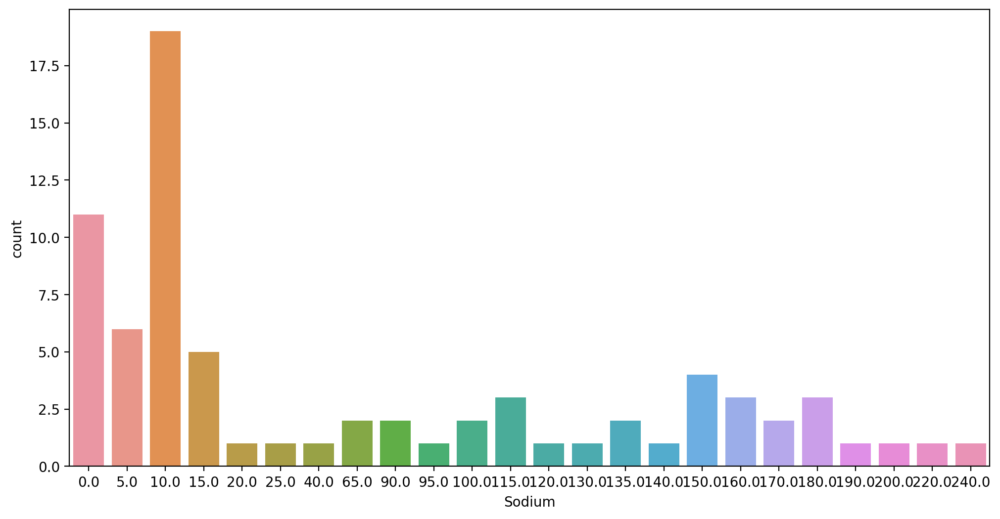

In [17]:
# sodium
plt.figure(figsize= (12,6), dpi = 200)
sns.countplot(x = "Sodium", data = data)

In [18]:
data.groupby(by = "Unnamed: 0").Sodium.mean().sort_values(ascending = False)

Unnamed: 0
White Chocolate Mocha                                240.0
Mocha Frappuccino® Blended Coffee                    220.0
Coffee Light Frappuccino® Blended Coffee             200.0
Iced White Chocolate Mocha                           190.0
Coconutmilk Mocha Macchiato                          180.0
                                                     ...  
Toasted Coconut Cold Brew                              NaN
Vanilla Bean Crème Frappuccino® Blended Crème          NaN
Violet Drink                                           NaN
White Chocolate Mocha Bottled Frappuccino              NaN
White Chocolate Mocha Frappuccino® Blended Coffee      NaN
Name: Sodium, Length: 154, dtype: float64

<Axes: xlabel='Sodium', ylabel='Unnamed: 0'>

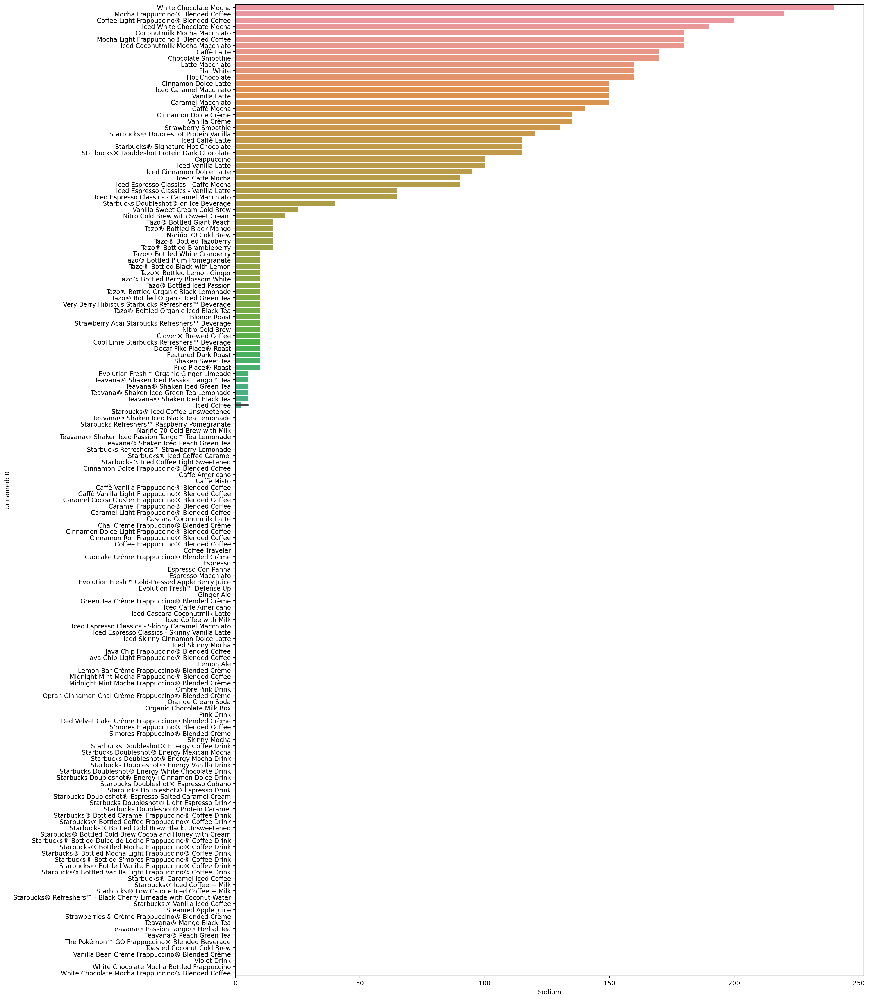

In [19]:
order_desc = data.groupby(by = "Unnamed: 0").Sodium.mean().sort_values(ascending = False).index
plt.figure(figsize= (18,28), dpi = 200)
sns.barplot(x = "Sodium", y ="Unnamed: 0", data = data, order = order_desc )

- **White Chocolate Mocha, Mocha Frappuccino® Blended Coffee are more sodiumlable is very high**

### fat

In [20]:
# fat 
data['Fat (g)'].value_counts()

0.0     41
2.5      6
6.0      6
7.0      5
9.0      3
4.0      3
5.0      2
8.0      2
4.5      2
26.0     1
1.0      1
11.0     1
0.5      1
2.0      1
Name: Fat (g), dtype: int64

<Axes: xlabel='Fat (g)', ylabel='count'>

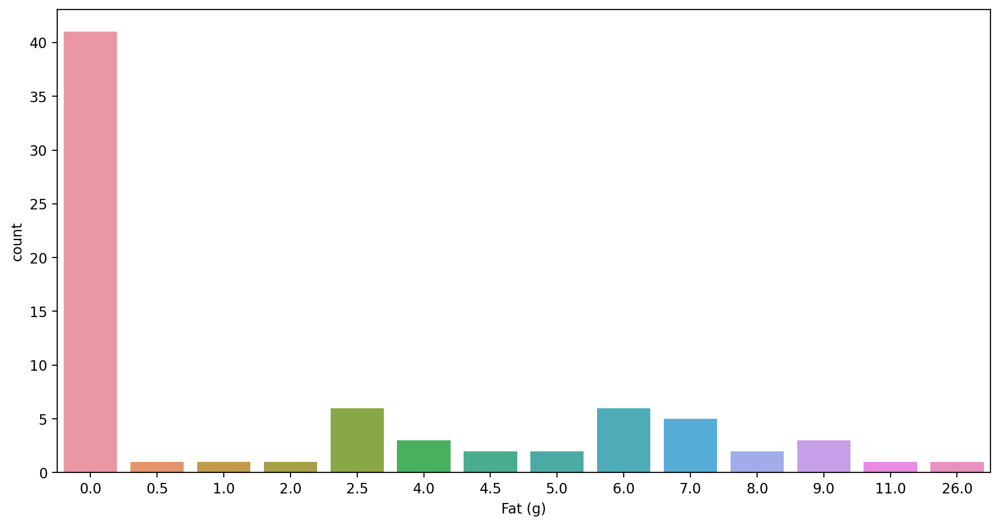

In [21]:
plt.figure(figsize= (12,6), dpi = 200)
sns.countplot(x ="Fat (g)", data = data)

In [22]:
data.groupby(by = "Unnamed: 0")["Fat (g)"].mean().sort_values(ascending = False)

Unnamed: 0
Starbucks® Signature Hot Chocolate                   26.0
White Chocolate Mocha                                11.0
Hot Chocolate                                         9.0
Iced Coconutmilk Mocha Macchiato                      9.0
Coconutmilk Mocha Macchiato                           9.0
                                                     ... 
Toasted Coconut Cold Brew                             NaN
Vanilla Bean Crème Frappuccino® Blended Crème         NaN
Violet Drink                                          NaN
White Chocolate Mocha Bottled Frappuccino             NaN
White Chocolate Mocha Frappuccino® Blended Coffee     NaN
Name: Fat (g), Length: 154, dtype: float64

<Axes: xlabel='Fat (g)', ylabel='Unnamed: 0'>

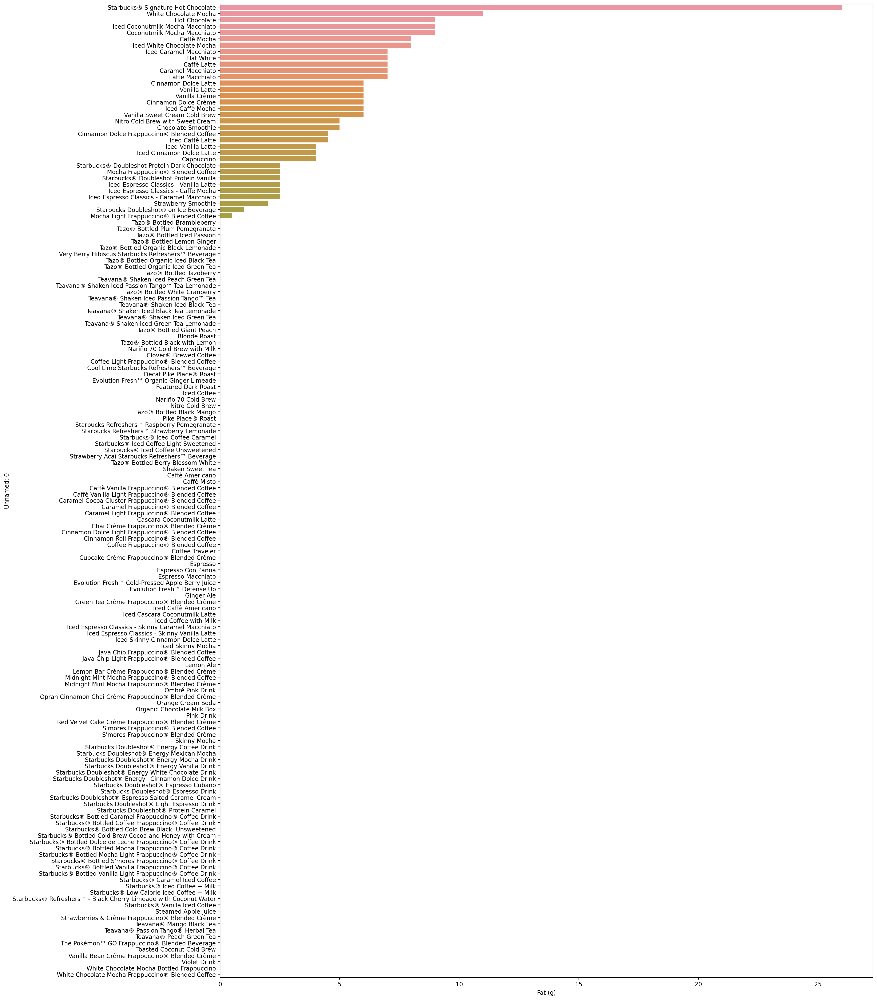

In [23]:
fat_desc = data.groupby(by ="Unnamed: 0")["Fat (g)"].mean().sort_values(ascending = False).index
plt.figure(figsize= (20,30), dpi = 200)
sns.barplot(y ="Unnamed: 0",x = "Fat (g)", data = data, order = fat_desc )

- **Starbucks® Signature Hot Chocolate and White Chocolate Mocha are more Fat_(g) consume** 

### fiber

In [24]:
data["Fiber (g)"].value_counts()

0.0    63
1.0     3
2.0     3
4.0     3
5.0     1
8.0     1
7.0     1
Name: Fiber (g), dtype: int64

<Axes: xlabel='Fiber (g)', ylabel='count'>

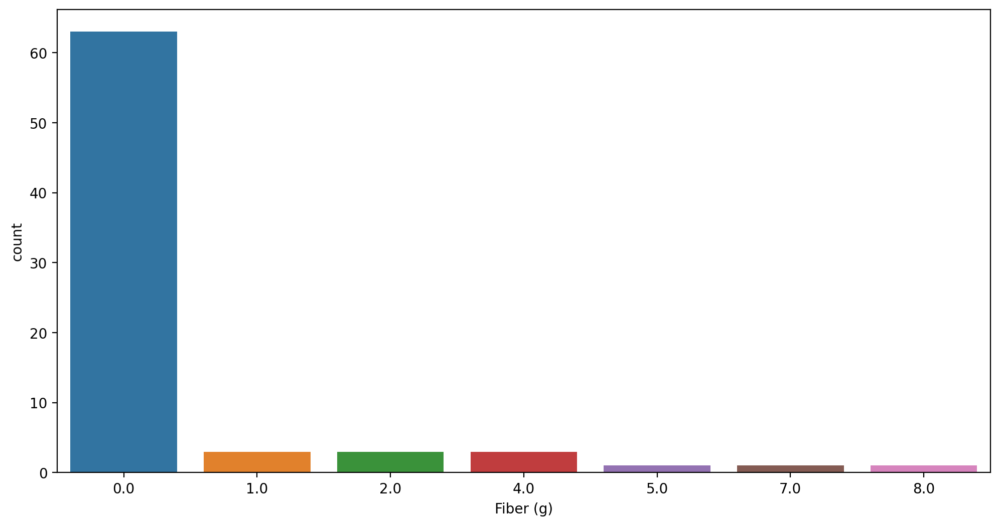

In [25]:
plt.figure(figsize= (12,6), dpi = 200)
sns.countplot(x = "Fiber (g)", data = data)

In [26]:
data.groupby(by = "Unnamed: 0")["Fiber (g)"].mean().sort_values(ascending = False)

Unnamed: 0
Chocolate Smoothie                                   8.0
Strawberry Smoothie                                  7.0
Starbucks® Signature Hot Chocolate                   5.0
Caffè Mocha                                          4.0
Iced Caffè Mocha                                     4.0
                                                    ... 
Toasted Coconut Cold Brew                            NaN
Vanilla Bean Crème Frappuccino® Blended Crème        NaN
Violet Drink                                         NaN
White Chocolate Mocha Bottled Frappuccino            NaN
White Chocolate Mocha Frappuccino® Blended Coffee    NaN
Name: Fiber (g), Length: 154, dtype: float64

<Axes: xlabel='Fiber (g)', ylabel='Unnamed: 0'>

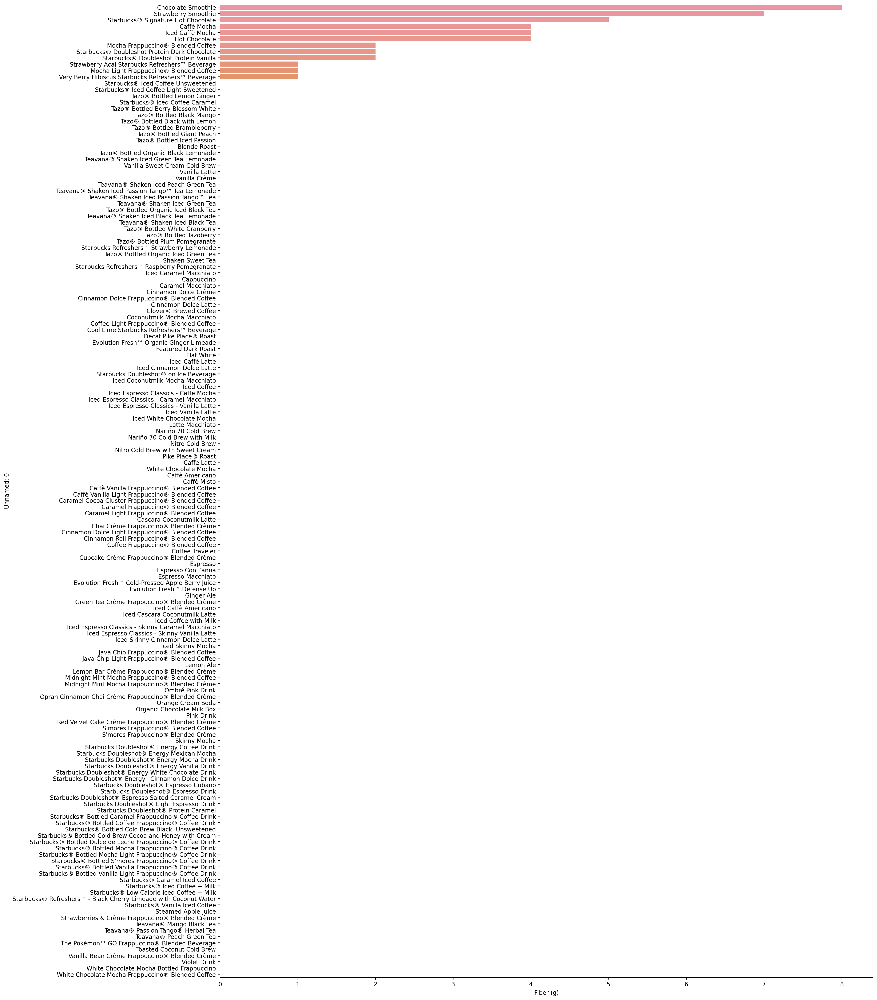

In [27]:
fibar_desc = data.groupby(by = "Unnamed: 0")["Fiber (g)"].mean().sort_values(ascending = False).index
plt.figure(figsize= (20,30), dpi = 200)
sns.barplot(y ="Unnamed: 0",x = "Fiber (g)", data = data, order =fibar_desc)

- **Chocolate Smoothie, Strawberry Smoothie are more fiber contain**

### protin

In [28]:
Protein =data.Protein.value_counts()
Protein

0.0     32
1.0     10
12.0     5
10.0     5
5.0      3
20.0     3
14.0     2
13.0     2
8.0      2
11.0     2
7.0      2
3.0      2
4.0      2
9.0      1
15.0     1
16.0     1
Name: Protein, dtype: int64

<Axes: xlabel='Protein', ylabel='count'>

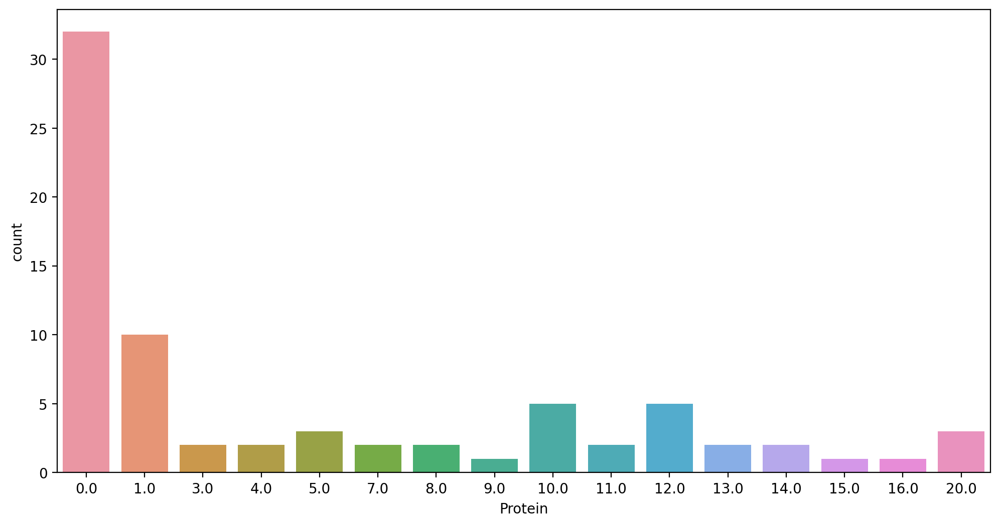

In [29]:
plt.figure(figsize= (12,6), dpi = 200)
sns.countplot(x ="Protein", data = data)

In [30]:
data.groupby("Unnamed: 0").Protein.mean().sort_values(ascending = False)

Unnamed: 0
Starbucks® Doubleshot Protein Dark Chocolate         20.0
Chocolate Smoothie                                   20.0
Starbucks® Doubleshot Protein Vanilla                20.0
Strawberry Smoothie                                  16.0
Cinnamon Dolce Frappuccino® Blended Coffee           15.0
                                                     ... 
Toasted Coconut Cold Brew                             NaN
Vanilla Bean Crème Frappuccino® Blended Crème         NaN
Violet Drink                                          NaN
White Chocolate Mocha Bottled Frappuccino             NaN
White Chocolate Mocha Frappuccino® Blended Coffee     NaN
Name: Protein, Length: 154, dtype: float64

<Axes: xlabel='Protein', ylabel='Unnamed: 0'>

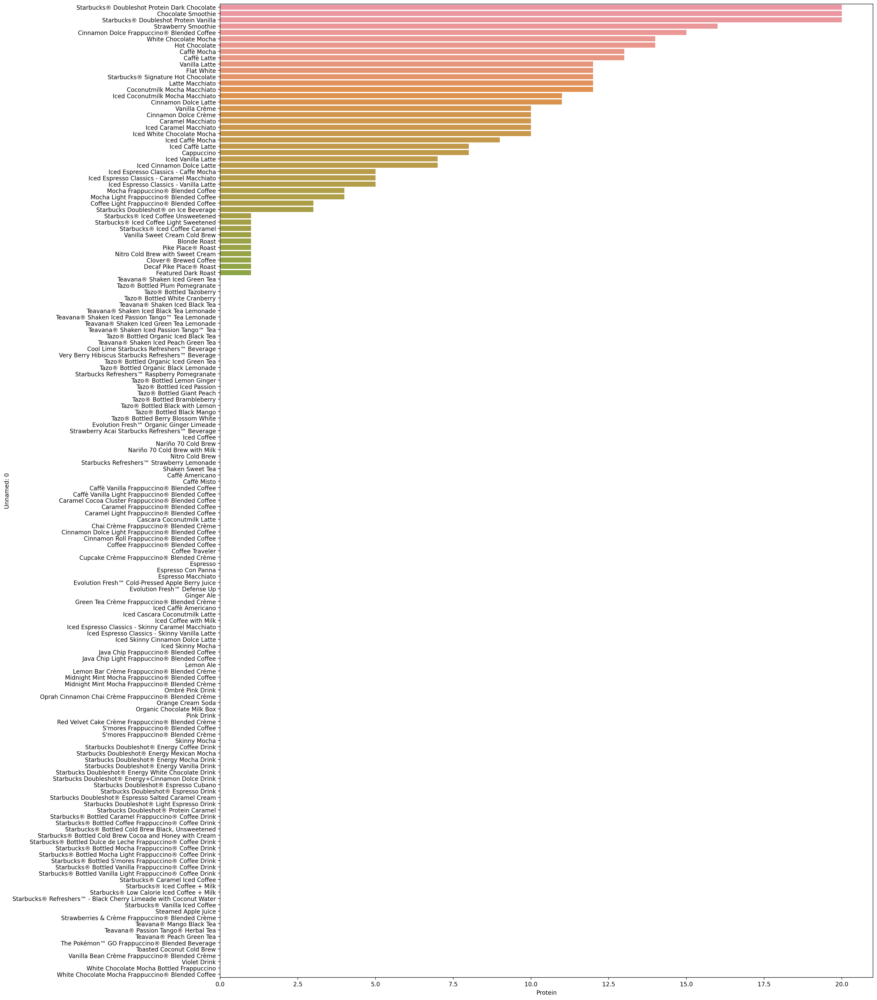

In [31]:
Protein_desc = data.groupby("Unnamed: 0").Protein.mean().sort_values(ascending = False).index
plt.figure(figsize= (20,30), dpi = 200)
sns.barplot(y ="Unnamed: 0",x = "Protein", data = data, order = Protein_desc)

- **Starbucks® Doubleshot Protein Dark Chocolate, Chocolate Smoothie have carry more Protein** 

### carb

In [32]:
carb = data['Carb. (g)'].value_counts()
carb

0.0     10
35.0     6
28.0     4
19.0     3
15.0     3
37.0     3
17.0     3
34.0     3
8.0      3
11.0     2
18.0     2
53.0     2
47.0     2
5.0      2
13.0     2
27.0     2
24.0     2
21.0     2
14.0     2
60.0     2
38.0     2
31.0     2
2.0      1
23.0     1
45.0     1
33.0     1
12.0     1
40.0     1
32.0     1
36.0     1
30.0     1
64.0     1
42.0     1
Name: Carb. (g), dtype: int64

<Axes: xlabel='Carb. (g)', ylabel='count'>

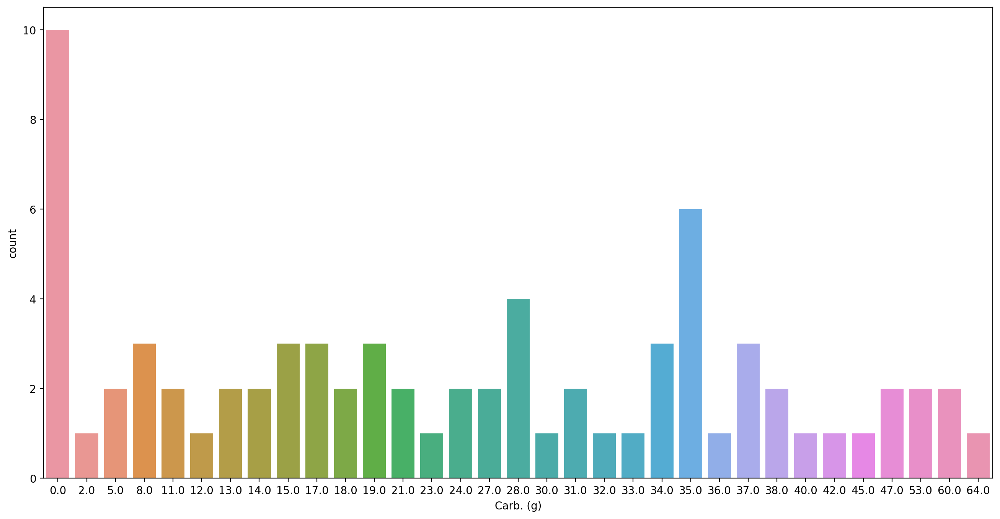

In [33]:
plt.figure(figsize= (16,8), dpi = 200)
sns.countplot(x = "Carb. (g)", data = data)

In [34]:
data.groupby('Unnamed: 0')['Carb. (g)'].mean().sort_values(ascending = False)

Unnamed: 0
Cinnamon Dolce Frappuccino® Blended Coffee           64.0
Strawberry Smoothie                                  60.0
Mocha Frappuccino® Blended Coffee                    60.0
White Chocolate Mocha                                53.0
Chocolate Smoothie                                   53.0
                                                     ... 
Toasted Coconut Cold Brew                             NaN
Vanilla Bean Crème Frappuccino® Blended Crème         NaN
Violet Drink                                          NaN
White Chocolate Mocha Bottled Frappuccino             NaN
White Chocolate Mocha Frappuccino® Blended Coffee     NaN
Name: Carb. (g), Length: 154, dtype: float64

<Axes: xlabel='Carb. (g)', ylabel='Unnamed: 0'>

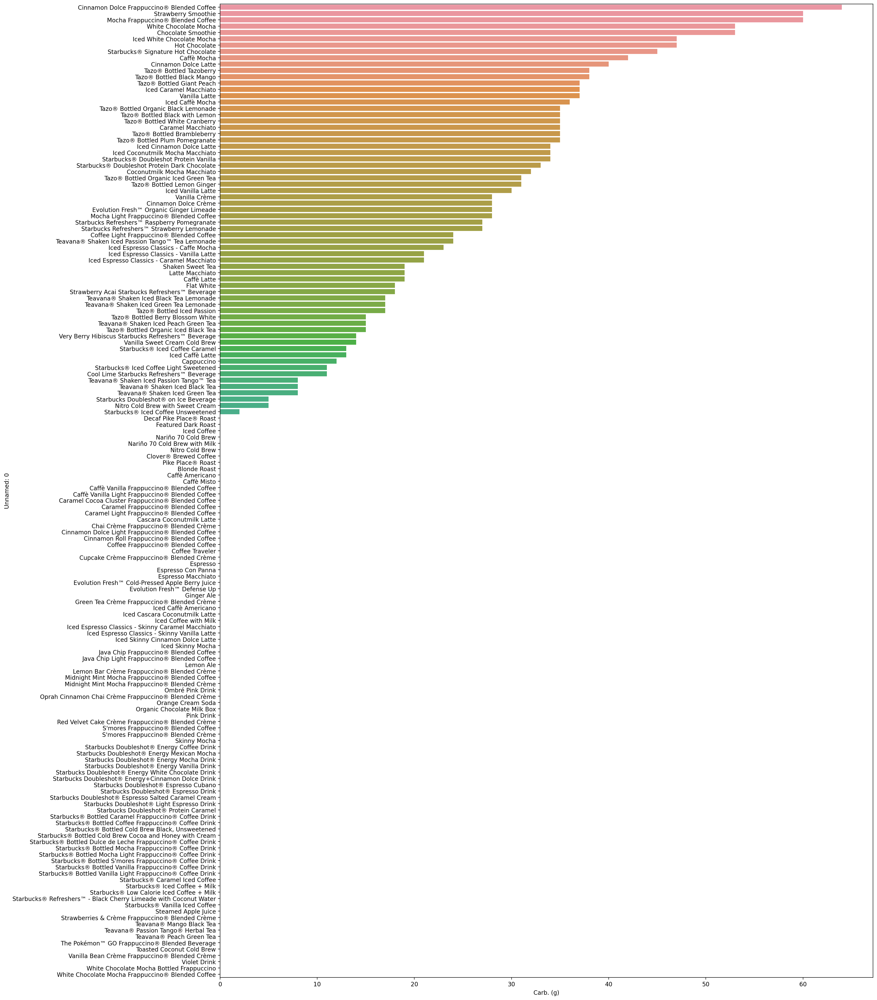

In [35]:
Carb_desc = data.groupby('Unnamed: 0')['Carb. (g)'].mean().sort_values(ascending = False).index
plt.figure(figsize= (20,30), dpi = 200)
sns.barplot(y ="Unnamed: 0",x = "Carb. (g)", data = data, order = Carb_desc)

- **Cinnamon Dolce Frappuccino® Blended Coffee, Strawberry Smoothie are carry more Carb.**

In [36]:
data.corr()

,Calories,Fat (g),Carb. (g),Fiber (g),Protein,Sodium
Calories,1.000000,0.773162,0.896990,0.526378,0.802572,0.751304
Fat (g),0.773162,1.000000,0.447633,0.381299,0.672372,0.655419
Carb. (g),0.896990,0.447633,1.000000,0.482017,0.580850,0.545830
Fiber (g),0.526378,0.381299,0.482017,1.000000,0.545138,0.349471
Protein,0.802572,0.672372,0.580850,0.545138,1.000000,0.783968
Sodium,0.751304,0.655419,0.545830,0.349471,0.783968,1.000000


<Axes: >

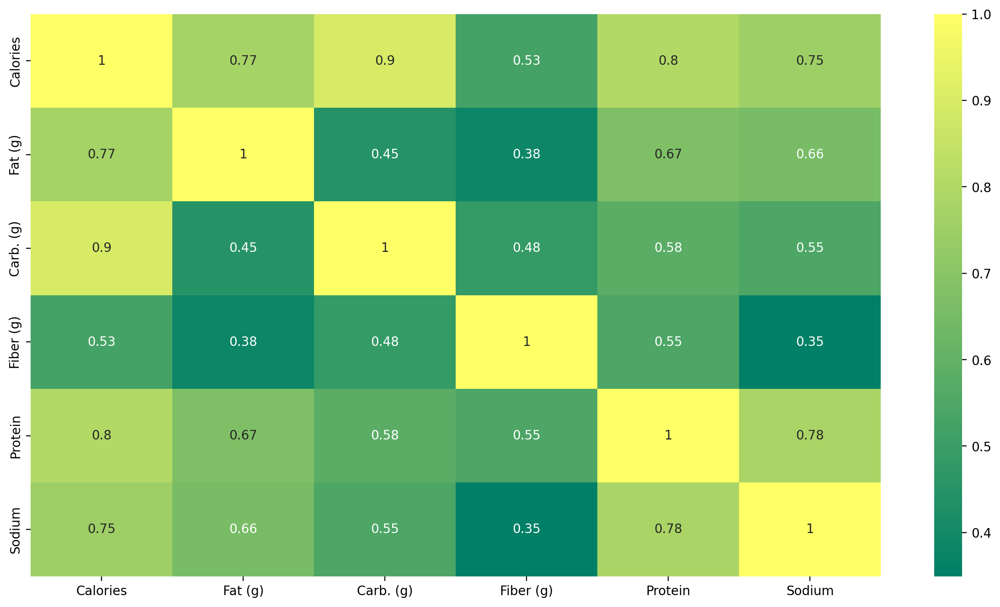

In [38]:
plt.figure(figsize=(15,8), dpi = 200)
sns.heatmap(data.corr(), annot=True, cmap="summer")

# Conclusion